# Creating merged restart files
I ran a run from rest with the chosen BGC initial conditions for 1 sec, creating a full set of restart files.
I will try to replace all possible physical variables from the long physics only spinup to create a hybrid reset file. 
I might have to do this again once I settle on a final set of initial conditions

In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import os
from dask.diagnostics import ProgressBar
%matplotlib inline

In [2]:
def plot_set(ds):
    sel_vars = ['Time', 'Interface', 'Layer']
    # pick only variables that have lat and lon dimensions
    dvars = [dv for dv in ds.data_vars if len(set(ds[dv].dims) - set(sel_vars)) > 0]
    ncols = 4
    nrows = (len(dvars) // 4) + 1
    print('printint %i by %i panels' %(ncols, nrows))
    
    fig, axarr = plt.subplots(ncols=ncols, nrows=nrows, figsize=[8*ncols,4*nrows])
    for ax,var in zip(axarr.flat, dvars):
        print(var)
        da = ds[var]
        for sel_var in sel_vars:
            if sel_var in da.dims:
                if sel_var == 'Time':
                    a = 0
                else:
                    a = 2
                da = da.isel({sel_var:a})
        da.plot.imshow(ax=ax, robust=True)

Right now thes things are a bit in disarray. I will have to resort these things when I am sure this works.

In [3]:
# physics_path = '/gpfsm/dhome/jjbuseck/jjbuseck/model_setups/xanadu_mom6_20181101/OM4p125_IAF_csf_JRA55do1-3_r5_cycle4/archive/restart_combined_experimental/new/'
physics_path = '/discover/nobackup/jjbuseck/model_setups/OM4p_125/xanadu_mom6_20181101/OM4p125_IAF_csf_JRA55do1-3_r5_cycle4/archive/restart_merged/'

# This needs to be replaced by the new version
# bgc_1sec_path = '/discover/nobackup/jjbuseck/model_setups_old_delete/xanadu_mom6_20181101/OM4p125_IAF_csf_JRA55do1-3_r5_cycle4/archive/restart_init_bgc_from_rest_1sec/'
# I wonder if I can read this directly from `/archive/u/jjbuseck' once I have it copied...that would free up space on 
# The whole run is archived on dirac `archive/u/jjbuseck/archive/ [Fill concrete path]
bgc_1sec_path = '/discover/nobackup/jjbuseck/models/MOM6_testing/BOM_0125_r0_1secrun/geoclim-mom6/MOM6_SIS2_COBALT/BOM_0125_JRA_1.3/RESTART/'

odir = '/discover/nobackup/jjbuseck/model_setups/BOM_0125/archive/restart_full_init_OM4p_125'

In [4]:
# iceberg_path = '/gpfsm/dhome/jjbuseck/jjbuseck/model_setups/xanadu_mom6_20181101/OM4p125_IAF_csf_JRA55do1-3_r5_cycle4/archive_alternative_with_icebergs/hide_from_fre/'

In [5]:
ds_physics = xr.open_mfdataset(os.path.join(physics_path, 'MOM.res*.nc'))
ds_physics

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).The datasets supplied require both concatenation and merging. From
xarray version 0.14 this will operation will require either using the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset), with a nested list structure 

<xarray.Dataset>
Dimensions:           (Interface: 76, Layer: 75, Time: 1, lath: 2240, latq: 2240, lonh: 2880, lonq: 2880)
Coordinates:
  * lath              (lath) float64 -83.62 -83.58 -83.54 ... 89.86 89.92 89.97
  * latq              (latq) float64 -83.6 -83.56 -83.52 ... 89.89 89.95 90.0
  * lonh              (lonh) float64 -298.6 -298.5 -298.4 ... 61.05 61.16 61.28
  * lonq              (lonq) float64 -298.5 -298.4 -298.3 ... 61.12 61.23 61.35
  * Layer             (Layer) float64 1.0 3.0 5.0 ... 3.591e+03 5.111e+03
  * Time              (Time) timedelta64[ns] 90353 days 01:16:18.871334
  * Interface         (Interface) float64 0.0 2.0 4.0 ... 3.722e+03 6.5e+03
Data variables:
    diffv             (Time, Layer, latq, lonh) float64 dask.array<shape=(1, 75, 2240, 2880), chunksize=(1, 75, 2240, 2880)>
    ubtav             (Time, lath, lonq) float64 dask.array<shape=(1, 2240, 2880), chunksize=(1, 2240, 2880)>
    vbtav             (Time, latq, lonh) float64 dask.array<shape=(1, 224

In [6]:
ds_bgc = xr.open_mfdataset(os.path.join(bgc_1sec_path, 'MOM.res*.nc'))
ds_bgc

<xarray.Dataset>
Dimensions:           (Interface: 76, Layer: 75, Time: 1, lath: 2240, latq: 2240, lonh: 2880, lonq: 2880)
Coordinates:
  * lath              (lath) float64 -83.62 -83.58 -83.54 ... 89.86 89.92 89.97
  * lonh              (lonh) float64 -298.6 -298.5 -298.4 ... 61.05 61.16 61.28
  * latq              (latq) float64 -83.6 -83.56 -83.52 ... 89.89 89.95 90.0
  * lonq              (lonq) float64 -298.5 -298.4 -298.3 ... 61.12 61.23 61.35
  * Layer             (Layer) float64 1.0 3.0 5.0 ... 3.591e+03 5.111e+03
  * Time              (Time) timedelta64[ns] 74282 days 02:16:18.871373
  * Interface         (Interface) float64 0.0 2.0 4.0 ... 3.722e+03 6.5e+03
Data variables:
    diffv             (Time, Layer, latq, lonh) float64 dask.array<shape=(1, 75, 2240, 2880), chunksize=(1, 75, 2240, 2880)>
    ubtav             (Time, lath, lonq) float64 dask.array<shape=(1, 2240, 2880), chunksize=(1, 2240, 2880)>
    vbtav             (Time, latq, lonh) float64 dask.array<shape=(1, 224

In [7]:
# combine fields
ds_combined = ds_bgc.copy()
missed_vars = []
for var in ds_physics.data_vars:
    if var in ds_bgc.data_vars:
        ds_combined[var].data = ds_physics[var].data
    else:
        missed_vars.append(var)
print('Missed: %s' %missed_vars)

Missed: ['m_to_Z', 'm_to_H']


In [8]:
# Do i only need to combine the mom files?

In [12]:
# delete the previously created files
!rm {odir}/MOM.res*.nc

In [14]:
filelist = os.listdir(bgc_1sec_path)
filelist = [f for f in filelist if 'MOM' in f]
# outdir = '/gpfsm/dhome/jjbuseck/jjbuseck/model_setups/xanadu_mom6_20181101/OM4p125_IAF_csf_JRA55do1-3_r5_cycle4/archive/merged_mom_files'

for file in filelist:
    print(file)
    pickvars = list(xr.open_mfdataset(os.path.join(bgc_1sec_path, file)).data_vars)
    ds_save = ds_combined[pickvars]
    with ProgressBar():
        ds_save.to_netcdf(os.path.join(odir, file))
    del ds_save

MOM.res.nc
[                                        ] | 0% Completed |  0.0s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.8s
MOM.res_1.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed | 10.6s
MOM.res_2.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.0s
MOM.res_3.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  5.8s
MOM.res_4.nc
[####                                    ] | 11% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  8.3s
MOM.res_5.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.4s
MOM.res_6.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.4s
MOM.res_7.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.4s
MOM.res_8.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.8s
MOM.res_9.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.8s
MOM.res_10.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.8s
MOM.res_11.nc
[########################################] | 100% Completed |  0.1s
[                                        ] | 0% Completed |  0.0s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  7.4s
MOM.res_12.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  5.7s
MOM.res_13.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.7s
MOM.res_14.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.7s
MOM.res_15.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.1s
MOM.res_16.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.7s
MOM.res_17.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.2s
MOM.res_18.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  9.2s
MOM.res_19.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.6s
MOM.res_20.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.4s
MOM.res_21.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.5s
MOM.res_22.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed | 10.0s
MOM.res_23.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  9.2s
MOM.res_24.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  8.2s
MOM.res_25.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.8s
MOM.res_26.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.9s
MOM.res_27.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.7s
MOM.res_28.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.0s
MOM.res_29.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.9s
MOM.res_30.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.3s
MOM.res_31.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.8s
MOM.res_32.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.0s
MOM.res_33.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.3s
MOM.res_34.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.5s
MOM.res_35.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  8.5s
MOM.res_36.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  8.1s
MOM.res_37.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.7s
MOM.res_38.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.8s
MOM.res_39.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.6s
MOM.res_40.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.8s
MOM.res_41.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.4s
MOM.res_42.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.3s
MOM.res_43.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.9s
MOM.res_44.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.5s
MOM.res_45.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.9s
MOM.res_46.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.2s
MOM.res_47.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.1s
MOM.res_48.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.1s
MOM.res_49.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.1s
MOM.res_50.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.8s
MOM.res_51.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.5s
MOM.res_52.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.4s
MOM.res_53.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.5s
MOM.res_54.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.6s
MOM.res_55.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  6.3s
MOM.res_56.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.3s
MOM.res_57.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed | 10.8s
MOM.res_58.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.1s
MOM.res_59.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.7s
MOM.res_60.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.7s
MOM.res_61.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  8.6s
MOM.res_62.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  5.0s
MOM.res_63.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  5.2s
MOM.res_64.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  5.1s
MOM.res_65.nc
[                                        ] | 0% Completed |  0.1s

/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/discover/nobackup/jjbuseck/code/miniconda/envs/mom6_design/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


[########################################] | 100% Completed |  7.2s


Ok that seemed successful...

printint 4 by 8 panels
diffv
ubtav
vbtav
ubt_IC
vbt_IC
uhbt_IC
vhbt_IC
Kd_shear
Kv_shear
Kv_slow
MLD
MLD_MLE_filtered
age
MEKE
MEKE_Kh
Salt
TKE_turb
Temp
v
frazil
ave_ssh
sfc
diffu
h
h2
u
u2
uh
v2
vh


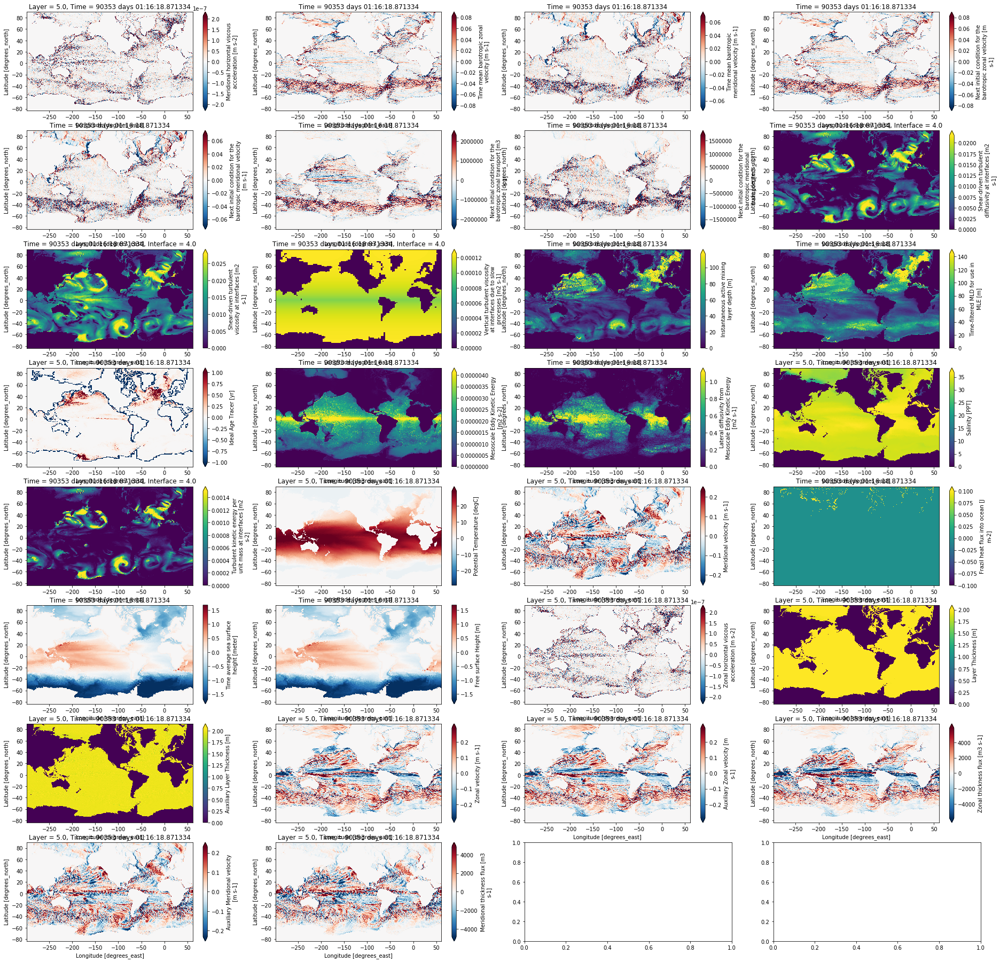

In [15]:
plot_set(ds_physics)

printint 4 by 20 panels
diffv
ubtav
vbtav
ubt_IC
vbt_IC
uhbt_IC
vhbt_IC
Kd_shear
Kv_shear
Kv_slow
MLD
MLD_MLE_filtered
alk
MEKE
MEKE_Kh
Salt
TKE_turb
Temp
age
v
frazil
ave_ssh
sfc
cadet_arag
cadet_arag_btf
cadet_calc
cadet_calc_btf
cased
chl
co3_ion
dic
diffu
fed
fedet
fedet_btf
fedi
felg
fesm
h
h2
htotal
irr_mem
ldon
ldop
lith
lithdet
lithdet_btf
mu_mem_ndi
mu_mem_nlg
mu_mem_nsm
nbact
ndet
ndet_btf
ndi
nh3
nh4
nlg
nlgz
nmdz
no3
nsm
nsmz
o2
pdet
pdet_btf
po4
sidet
sidet_btf
silg
sio4
sldon
sldop
srdon
srdop
u
u2
uh
v2
vh


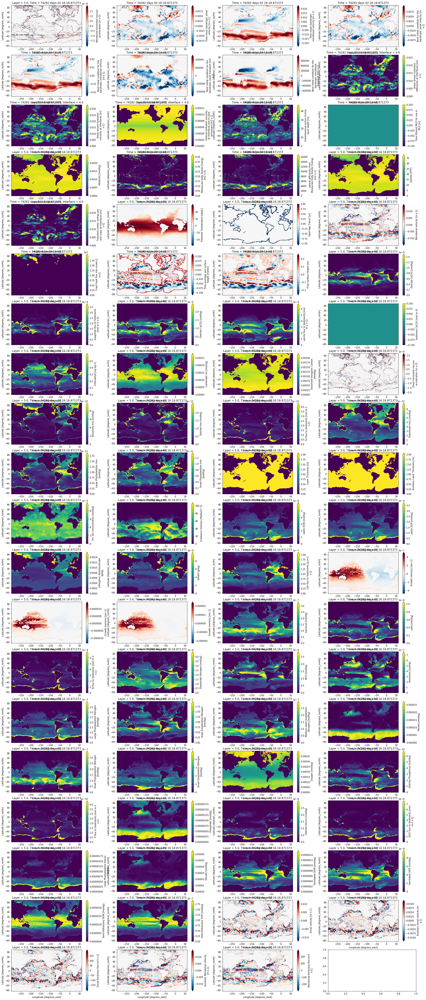

In [16]:
plot_set(ds_bgc)

In [ ]:
plot_set(ds_combined)

printint 4 by 20 panels
diffv
ubtav
vbtav
ubt_IC
vbt_IC
uhbt_IC
vhbt_IC
Kd_shear
Kv_shear
Kv_slow
MLD
MLD_MLE_filtered
alk
MEKE
MEKE_Kh
Salt
TKE_turb
Temp
age
v
frazil
ave_ssh
sfc
cadet_arag
cadet_arag_btf
cadet_calc
cadet_calc_btf
cased
chl
co3_ion
dic
diffu
fed
fedet
fedet_btf
fedi
felg
fesm


In [ ]:
# Link the other files

In [ ]:
for file in ['coupler.res', 'ice_model.res.nc', 'calving.res.nc', 'icebergs.res.nc']:
    !ln -sf {physics_path}{file} {odir}/
    
for file in ['ocean_cobalt_airsea_flux.res.nc', 'ice_cobalt.res.nc']:
    !ln -sf {bgc_1sec_path}{file} {odir}/

In [ ]:
!ls {odir}